In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib import animation

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/DF Unsupervised/Mall_Customers.csv')

In [ ]:
data.head()

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


In [ ]:
data.isnull().sum()

CustomerID                0
Gender                    0
Age                       0
Annual Income (k$)        0
Spending Score (1-100)    0
dtype: int64

In [ ]:
df = data.copy()
df['Annual Income'] = data['Annual Income (k$)']
df['Spending Score'] = data['Spending Score (1-100)']
df = df.drop(columns=['CustomerID','Gender','Annual Income (k$)','Spending Score (1-100)'])
df.head()

,Age,Annual Income,Spending Score
0,19,15,39
1,21,15,81
2,20,16,6
3,23,16,77
4,31,17,40


In [ ]:
!pip install validclust
from validclust import dunn
from sklearn.metrics import pairwise_distances

# Hierarchy Clustering

<function matplotlib.pyplot.show>

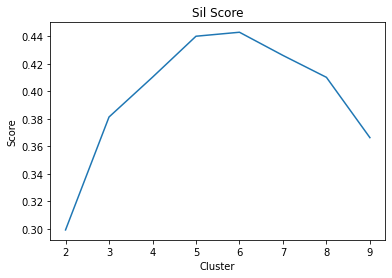

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

list_cluster = []
list_val = []
for i in range(2,10):
  hc = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='ward')
  cluster = hc.fit_predict(df)
  val = silhouette_score(df[['Age','Annual Income','Spending Score']], cluster)
  list_cluster.append(cluster)
  list_val.append(val)
  
plt.plot(range(2,10),list_val)
plt.title('Sil Score')
plt.xlabel('Cluster')
plt.ylabel('Score')
plt.show

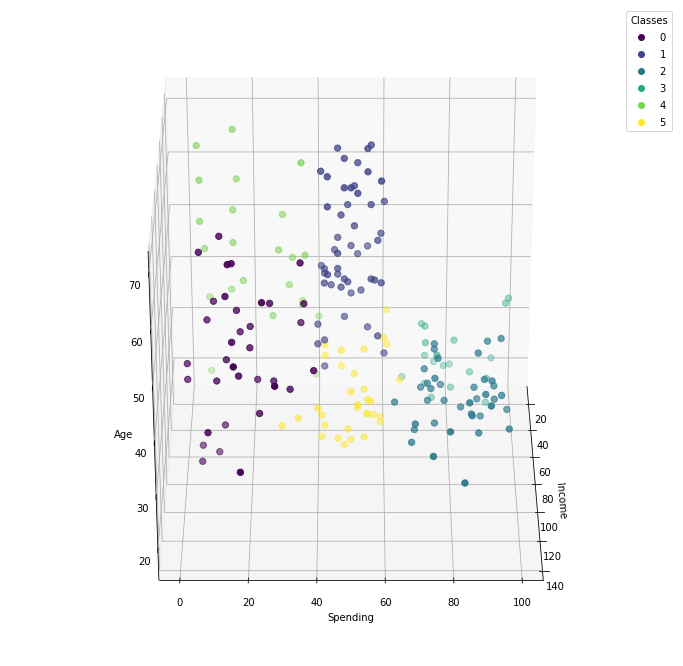

In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(projection='3d')
scatter = ax.scatter(df['Annual Income'],df['Spending Score'],df['Age'], c=list_cluster[4], s=40)
ax.set_xlabel('Income')
ax.set_ylabel('Spending')
ax.set_zlabel('Age')
ax.legend(*scatter.legend_elements(),
                    loc="upper right", title="Classes")
def animate(frame):
  ax.view_init(30, frame/4)
  plt.pause(.001)
  return fig
anim = animation.FuncAnimation(fig, animate, frames=800, interval=80)
HTML(anim.to_html5_video())

In [ ]:
pd.pivot_table(df, values=['Age','Annual Income','Spending Score'], 
               index=list_cluster[4], aggfunc=[np.mean,np.min,np.max])

mean                               ... amax                             
         Age Annual Income Spending Score  ...  Age Annual Income Spending Score
0  41.685714     88.228571      17.285714  ...   59           137             39
1  53.215686     55.117647      49.470588  ...   70            69             60
2  32.692308     86.538462      82.128205  ...   40           137             97
3  24.850000     24.950000      81.000000  ...   35            38             99
4  45.217391     26.304348      20.913043  ...   67            39             40
5  24.531250     54.187500      50.250000  ...   35            76             65

[6 rows x 9 columns]

In [ ]:
val = silhouette_score(df[['Age','Annual Income','Spending Score']], list_cluster[4])
val

0.44308912983504156

In [ ]:
dist = pairwise_distances(df)
dunn(dist, list_cluster[4])

0.0904475303477492

# DBSCAN

<function matplotlib.pyplot.show>

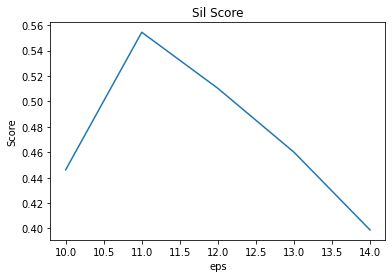

In [ ]:
from sklearn.cluster import DBSCAN

list_cluster = []
list_val = []
for i in range(10,15):
  db = DBSCAN(eps=i, min_samples=10)
  cluster = db.fit_predict(df)
  dfdb = df.copy()
  dfdb['cluster'] = cluster
  dfdb = dfdb[dfdb['cluster']!=-1]
  val = silhouette_score(dfdb[['Age','Annual Income','Spending Score']], dfdb['cluster'])
  list_cluster.append(cluster)
  list_val.append(val)
  
plt.plot(range(10,15),list_val)
plt.title('Sil Score')
plt.xlabel('eps')
plt.ylabel('Score')
plt.show

In [ ]:
db = DBSCAN(eps=11, min_samples=10)
cluster = db.fit_predict(df)
dfdb = df.copy()
dfdb['cluster'] = cluster
dfdb = dfdb[dfdb['cluster']!=-1]

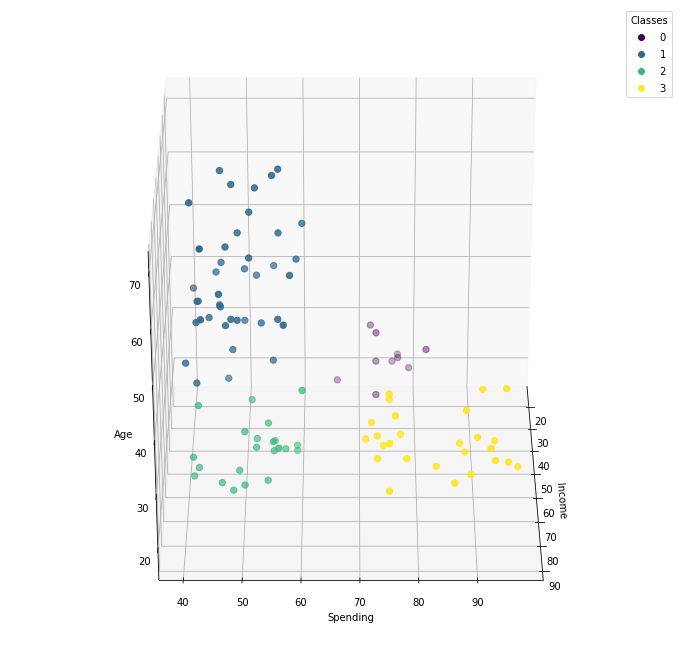

In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(projection='3d')
scatter = ax.scatter(dfdb['Annual Income'],dfdb['Spending Score'],dfdb['Age'], c=dfdb.cluster, s=40)
ax.set_xlabel('Income')
ax.set_ylabel('Spending')
ax.set_zlabel('Age')
ax.legend(*scatter.legend_elements(),
                    loc="upper right", title="Classes")
def animate(frame):
  ax.view_init(30, frame/4)
  plt.pause(.001)
  return fig
anim = animation.FuncAnimation(fig, animate, frames=800, interval=80)
HTML(anim.to_html5_video())

In [ ]:
pd.pivot_table(df, values=['Age','Annual Income','Spending Score'], 
               index=dfdb.cluster, aggfunc=[np.mean,np.min,np.max])

mean                ...          amax               
               Age Annual Income  ... Annual Income Spending Score
cluster                           ...                             
0.0      24.700000     22.000000  ...            30             82
1.0      52.512195     52.853659  ...            67             60
2.0      22.818182     57.954545  ...            67             60
3.0      33.038462     77.307692  ...            88             97

[4 rows x 9 columns]

In [ ]:
val = silhouette_score(dfdb[['Age','Annual Income','Spending Score']], dfdb['cluster'])
val

0.5544909902790619

In [ ]:
dist = pairwise_distances(dfdb)
dunn(dist, dfdb.cluster)

0.17260575342088003

# HDBSCAN

In [ ]:
!pip install hdbscan

In [ ]:
from hdbscan import HDBSCAN 

In [ ]:
cluster = HDBSCAN().fit(df).labels_

In [ ]:
dfhdb = df.copy()
dfhdb['cluster'] = cluster
dfhdb = dfhdb[dfhdb['cluster']!=-1]

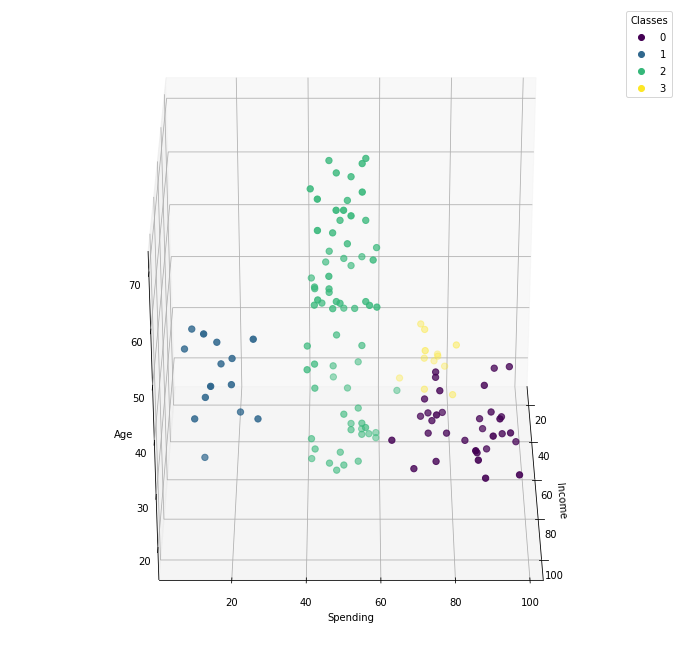

In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(projection='3d')
scatter = ax.scatter(dfhdb['Annual Income'],dfhdb['Spending Score'],dfhdb['Age'], c=dfhdb.cluster, s=40)
ax.set_xlabel('Income')
ax.set_ylabel('Spending')
ax.set_zlabel('Age')
ax.legend(*scatter.legend_elements(),
                    loc="upper right", title="Classes")
def animate(frame):
  ax.view_init(30, frame/4)
  plt.pause(.001)
  return fig
anim = animation.FuncAnimation(fig, animate, frames=800, interval=80)
HTML(anim.to_html5_video())

In [ ]:
pd.pivot_table(dfhdb, values=['Age','Annual Income','Spending Score'], 
               index=dfhdb.cluster, aggfunc=[np.mean,np.min,np.max])

mean                ...          amax               
               Age Annual Income  ... Annual Income Spending Score
cluster                           ...                             
0        32.727273     81.060606  ...           103             97
1        41.857143     82.214286  ...            98             27
2        43.154930     55.014085  ...            67             65
3        24.833333     23.916667  ...            34             82

[4 rows x 9 columns]

In [ ]:
val = silhouette_score(dfhdb[['Age','Annual Income','Spending Score']], dfhdb['cluster'])

In [ ]:
val

0.5031594452505356

In [ ]:
dist = pairwise_distances(dfhdb)
dunn(dist, dfhdb.cluster)

0.20067001862719536